<a href="https://colab.research.google.com/github/seohyeon-lee-2025/network_of_rings/blob/main/network_of_thrones.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [253]:
import pandas as pd

#kaggle dataset of Lord of the Rings characters

characters_df = pd.read_csv('./lotr_characters.csv')

In [254]:
'''
  get list of main characters of LOTR
    char_list = []
    create dictionary with main character names as keys
    create subdictionary for each 
    parse text. 
    if word in char_list:
      pick out the sentence. 
      add all other names (if any) in the same sentence as keys to subdictionary. 
      if a name is already in the subdictionary, value++
      else, subdict[name] = 1
    
    use this dictionary to create and define edges below

'''
#clean list of characters 
char_list = characters_df.name
char_list_fname = char_list.map(lambda x: x.split(" ")[0])
char_set = set(char_list_fname)

#set supports faster in operation
char_set.add("Moth")
char_set.add("King-of-the-Dead")
# char_list_simple = ["Sauron", "Treebeard", "Arwen", "Galadriel", "Elrond", "Merry", "Gimli", "Pippin", "Grima", "Theoden", "Eowyn", "Frodo", "Legolas", "Bilbo", "Samwise", "Saruman", "Gollum", "Aragorn", "Gandalf", "Goldberry", "Beorn"]
# char_set_simple = set(char_list_simple)

#character names that start with "The" or "in"

for row in char_list:
    if (row.split(" ")[0]=="The") or (row.split(" ")[0]=="in"):
        print(row)

in (King of Durin's Folk)
in
The Moth
The King of the Dead


In [265]:
#810 characters in char_set
len(char_set)

810

In [255]:
network_d = {}
 
# initialize network dictionary with character names. values are dictionaries on their own
for item in char_set:
    network_d[item] = {}

print(network_d)

{'Angelica': {}, 'Elladan': {}, 'Mandos': {}, 'Mosco': {}, 'Hugo': {}, 'Gorbag': {}, 'Myrtle': {}, 'Vardilmë': {}, 'Ossë': {}, 'Gildor': {}, 'Malach': {}, 'Ghân-buri-Ghân': {}, 'Gwaihir': {}, 'Ufthak': {}, 'Erkenbrand': {}, 'rimë': {}, 'Eärnur': {}, 'Aglahad': {}, 'King-of-the-Dead': {}, 'Harding': {}, 'Rudibert': {}, 'Diamond': {}, 'Gothmog': {}, 'Ted': {}, 'Fréa': {}, 'Fíli': {}, 'Ostoher': {}, 'Holman': {}, 'Draugluin': {}, 'Mat': {}, 'Erellont': {}, 'Andvír': {}, 'Bregalad': {}, 'Galador': {}, 'Hardang': {}, 'Telemnar': {}, 'Sadoc': {}, 'Damrod': {}, 'Herefara': {}, 'Halmir': {}, 'Nielíqui': {}, 'Fingon': {}, 'Elfhild': {}, 'Nahar': {}, 'Grishnákh': {}, 'Carcharoth': {}, 'Fingolfin': {}, 'Meriadoc': {}, 'Haldad': {}, 'Azaghâl': {}, 'Tar-Elendil': {}, 'Huor': {}, 'Meneldor': {}, 'Fastred': {}, 'Dwalin': {}, 'Nellas': {}, 'Arwen': {}, 'Tarannon': {}, 'Ancalagon': {}, 'Aragost': {}, 'Mairen': {}, 'Dori': {}, 'Vorondil': {}, 'Warg': {}, 'Thengel': {}, 'Telumehtar': {}, 'Elatan': {}, 'D

In [257]:
f = open("book1.txt", "r", encoding = "ISO-8859-1")

#open LOTR rext file and read line by line
f_lst = []
while True:
 
    # Get next line from file
    line = f.readline()
    f_lst.append(line.strip())
 
    # if line is empty
    # end of file is reached
    if not line:
        break

#debug code
f_lst[:5]


['Three Rings for the Elven-kings under the sky,',
 'Seven for the Dwarf-lords in their halls of stone,',
 'Nine for Mortal Men doomed to die,',
 'One for the Dark Lord on his dark throne',
 'In the Land of Mordor where the Shadows lie.']

In [267]:
#assumption: if 2 characters get mentioned in the same line, they must have had an interaction. 

import string
for line in f_lst:
  if (len(line) > 0):
    #get rid of punctuation marks
    line = line.translate(str.maketrans('', '', string.punctuation))
    #break line down into set of words
    line_set = set(line.split(" "))
    #take intersection of character list and words in line -> get characters mentioned in line
    intersection = line_set.intersection(char_set)

    #print(intersection)

#if 2 or more characters are mentioned together in one line
    if (len(intersection) >1):
      #print(len(intersection))
      #loop through intersection: for all characters mentioned
      for word in intersection:
        #for each character, add all other characters in intersection to subdictionary
        for subitem in intersection:
          #do not make subdictionaries like network_d[frodo][frodo] bcs it's pointless
          if subitem != word:
            #if we did [frodo][bilbo] then we shouldn't create [bilbo][frodo]
            if word not in network_d[subitem].keys(): 
              #if network_d[word][subitem] already exists increment the value 
              if subitem in network_d[word].keys():
                network_d[word][subitem] += 1
                #else create entry and initialize value as 1
              else: network_d[word][subitem]=1

print(network_d)

print(network_d['Aragorn'])
print(len(network_d.keys()))
# print(network_d['Arwen'])
# print(network_d['Galadriel'])


{'Angelica': {}, 'Elladan': {'Elrond': 6, 'Frodo': 3, 'in': 6, 'The': 3, 'Aragorn': 3, 'Radagast': 3}, 'Mandos': {}, 'Mosco': {}, 'Hugo': {}, 'Gorbag': {}, 'Myrtle': {}, 'Vardilmë': {}, 'Ossë': {}, 'Gildor': {'Frodo': 36, 'Great': 3, 'in': 36, 'Farmer': 3}, 'Malach': {}, 'Ghân-buri-Ghân': {}, 'Gwaihir': {'Great': 3, 'Frodo': 3, 'Gandalf': 3}, 'Ufthak': {}, 'Erkenbrand': {}, 'rimë': {}, 'Eärnur': {}, 'Aglahad': {}, 'King-of-the-Dead': {}, 'Harding': {}, 'Rudibert': {}, 'Diamond': {}, 'Gothmog': {}, 'Ted': {'in': 12, 'Sandyman': 9, 'Gimli': 3, 'Boromir': 3, 'The': 3, 'Aragorn': 3, 'Legolas': 3}, 'Fréa': {}, 'Fíli': {}, 'Ostoher': {}, 'Holman': {'The': 3, 'Bilbo': 6, 'Frodo': 3, 'in': 6}, 'Draugluin': {}, 'Mat': {}, 'Erellont': {}, 'Andvír': {}, 'Bregalad': {}, 'Galador': {}, 'Hardang': {}, 'Telemnar': {}, 'Sadoc': {}, 'Damrod': {}, 'Herefara': {}, 'Halmir': {}, 'Nielíqui': {}, 'Fingon': {}, 'Elfhild': {}, 'Nahar': {}, 'Grishnákh': {}, 'Carcharoth': {}, 'Fingolfin': {}, 'Meriadoc': {'in':

In [259]:
val_list = []

for key in network_d.keys():
    for subkey in network_d[key]:
        print(key, subkey, network_d[key][subkey])
        val_list.append(network_d[key][subkey])


Elladan Elrond 2
Elladan Frodo 1
Elladan in 2
Elladan The 1
Elladan Aragorn 1
Elladan Radagast 1
Gildor Frodo 12
Gildor Great 1
Gildor in 12
Gildor Farmer 1
Gwaihir Great 1
Gwaihir Frodo 1
Gwaihir Gandalf 1
Ted in 4
Ted Sandyman 3
Ted Gimli 1
Ted Boromir 1
Ted The 1
Ted Aragorn 1
Ted Legolas 1
Holman The 1
Holman Bilbo 2
Holman Frodo 1
Holman in 2
Meriadoc in 4
Meriadoc Elrond 1
Meriadoc Sauron 1
Meriadoc Great 1
Meriadoc Fredegar 1
Meriadoc Bilbo 1
Meriadoc Frodo 1
Meriadoc Aragorn 1
Meriadoc Legolas 1
Dwalin Nori 1
Dwalin Dori 1
Dwalin Bifur 1
Dwalin Frodo 1
Arwen Barahir 1
Arwen The 3
Arwen Aragorn 4
Arwen Faramir 1
Arwen Frodo 4
Arwen in 5
Arwen Elladan 1
Arwen Elrond 3
Ancalagon Sauron 1
Ancalagon Black 1
Ancalagon in 1
Dori Bifur 1
Dori Frodo 1
Legolas Galdor 1
Legolas Frodo 21
Legolas in 48
Legolas Gollum 2
Legolas Gandalf 8
Legolas Isildur 1
Legolas Boromir 14
Legolas Nimrodel 6
Legolas Great 2
Legolas Celeborn 1
Legolas Elrond 1
Merry Frodo 61
Merry Otho 1
Merry in 86
Merry Fo

796
412


1.0

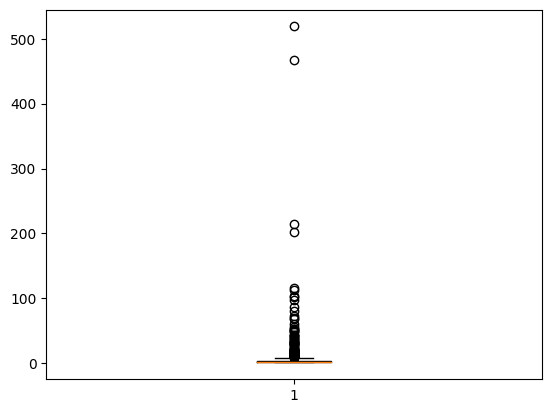

In [275]:
#histogram of distribution of edge weights
import matplotlib.pyplot as plt
import numpy as np

plt.boxplot(x = val_list)

#810 -> 796
print(len(val_list))

print(len([x for x in val_list if x==1]))

#median weight = 1 
#412 are exactly 1

np.median(val_list)

[8, 43, 79, 103, 77, 43, 9, 14, 44, 6, 5, 46, 8, 13, 36, 33, 31, 5, 47, 21, 27, 12, 6, 6, 6, 6, 8, 14, 6, 3, 26, 14, 17, 22, 8, 16, 30, 6, 11, 33, 32, 24, 27, 16, 8, 13, 8, 14, 38, 2, 4, 5, 4, 8, 6, 13, 11, 5, 9, 3, 5, 20, 9, 15, 2, 8, 5, 6, 3, 11, 12, 9, 7, 3, 14, 9, 9, 9, 7, 7, 5, 7, 2, 4, 4, 3, 3, 3, 10, 6, 21, 4, 8, 8, 3, 4, 1, 2, 5, 8, 15, 2, 10, 12, 6, 16, 8, 2, 6, 6, 11, 1, 4, 5, 5, 3, 1]


{'whiskers': [<matplotlib.lines.Line2D at 0x15ad823e0>,
 'caps': [<matplotlib.lines.Line2D at 0x1151b3cd0>,
 'boxes': [<matplotlib.lines.Line2D at 0x15ad837f0>],
 'medians': [<matplotlib.lines.Line2D at 0x1151b29e0>],
 'fliers': [<matplotlib.lines.Line2D at 0x144b2ad10>],
 'means': []}

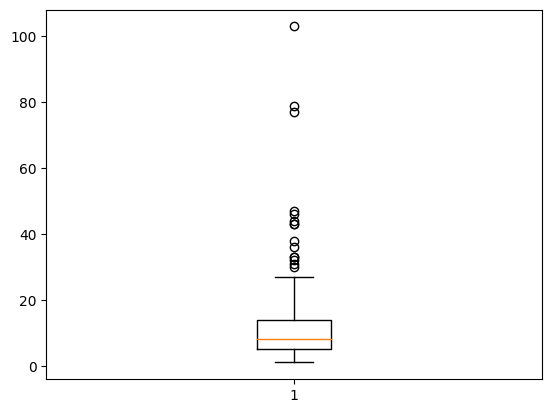

In [276]:
#box distribution of node degrees
deg_list = [G.degree[v] for v in G.nodes]
print([G.degree[v] for v in G.nodes]) # omits 0's

#plt.hist(x = deg_list)
plt.boxplot(x = deg_list)

In [176]:
import networkx as nx

#instantiate empty graph
G = nx.Graph()

#loop through network_d and add edges w weight
for key in network_d.keys():
    for subkey in network_d[key]:
        G.add_edge(key, subkey, weight = network_d[key][subkey])


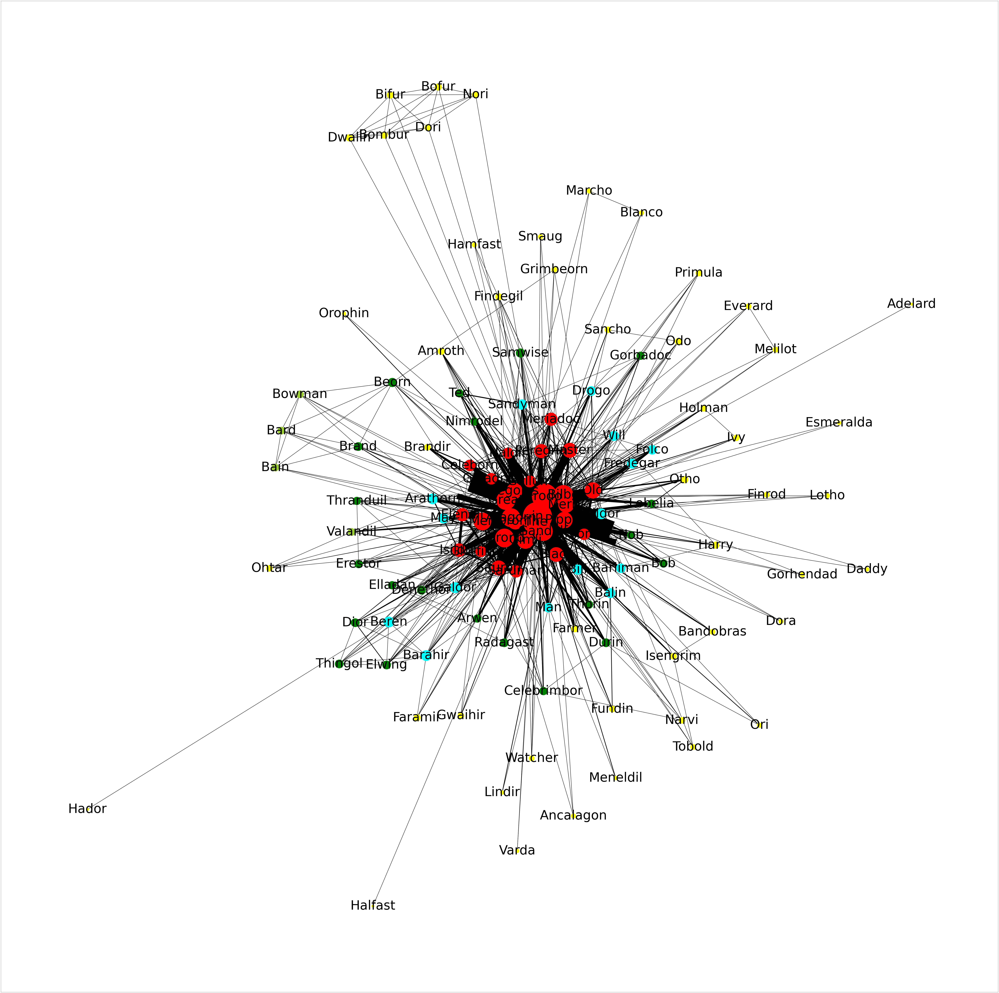

In [284]:
#visualization

#set image dimensions and quality
fig = plt.figure(1, figsize=(140, 140), dpi=60)
#node position. seed for reproducibility
pos=nx.spring_layout(G, scale = 7, seed = 47)

edges = G.edges()

#edge thickness proportional to weight
weights = [G[u][v]['weight']*2.5 for u,v in edges]

node_size = [G.degree[v]*500 for v in G.nodes]
node_color = []

cmap = plt.cm.plasma

color_map = []
for node in G:
    if G.degree[node] < 7: #below lower quartile
        color_map.append('yellow')
    elif G.degree[node] < 8: 
        color_map.append('yellowgreen')   
    elif G.degree[node] < 11:
        color_map.append('green')
    elif G.degree[node] < 15:
        color_map.append('cyan')
    else:
        color_map.append('red')

nx.draw_networkx(G, pos, edgelist=edges, width=weights, node_size = node_size,  font_size = 100, node_color = color_map)


#TODO: make all characters in dataset appear. if degree 0, possibly as node with no eedges



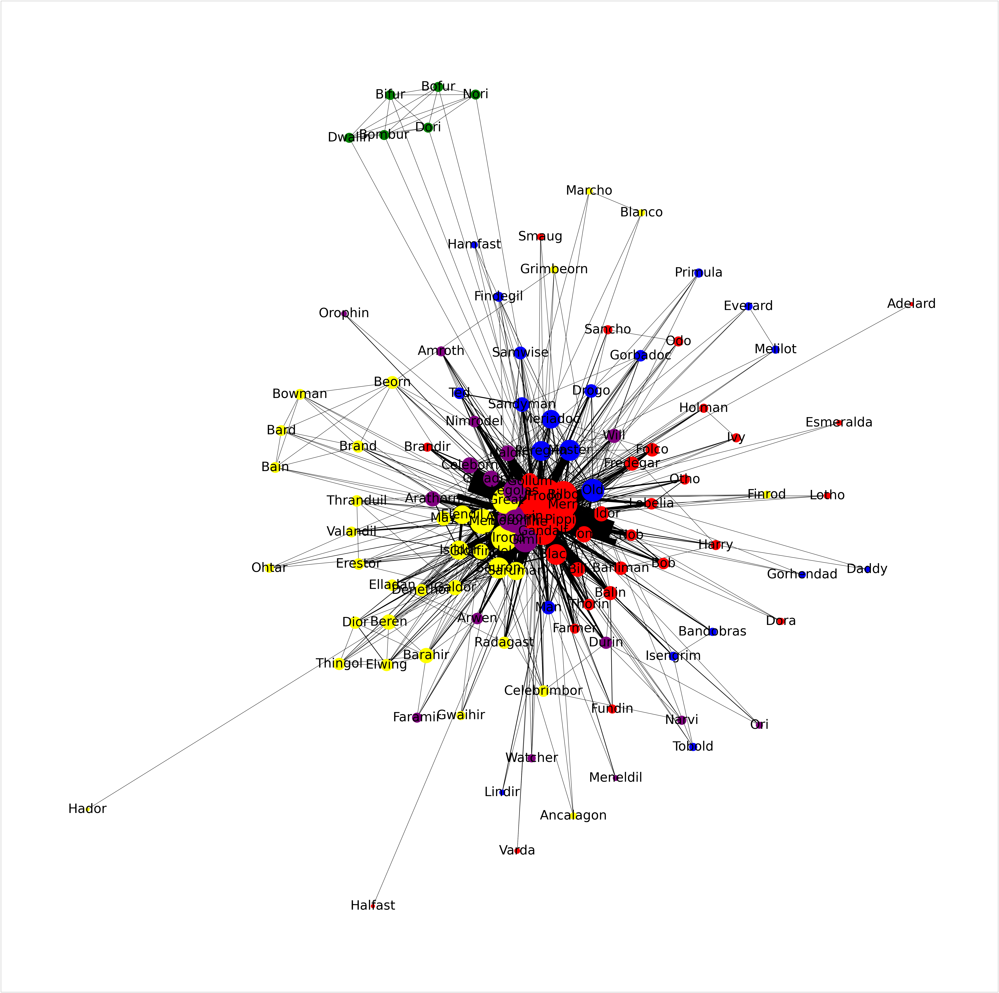

In [288]:
import community
from community import community_louvain

fig = plt.figure(2, figsize=(140, 140), dpi=60)
node_size = [G.degree[v]*1000 for v in G.nodes]

partition = community_louvain.best_partition(G)

#different colors for different partitions

color_map_partitions = []
for node in G:
    color_list = ["yellow", "blue", "purple", "red", "green"]
    for key, val in partition_dict.items():
        if node in set(val):
            color_map_partitions.append(color_list[key])
        

nx.draw_networkx(G, pos, partition.keys(), edgelist=edges, width=weights, node_size = node_size, node_color = color_map_partitions, font_size = 100)


In [198]:
community_louvain.modularity(partition, G, weight='weight')
#QUESTION: what does this value mean
#since Q > 0 there is community but they are not strongly separated from each other as shown in the low value
#in the graph aove the yellow community has overlaps with red and purple and the red community has overlaps with blue


0.08983283514419961

In [210]:
#for node, community_id in partition.items():
    #print("Node", node, "belongs to community", community_id)

print(partition.items())

dict_items([('Elladan', 0), ('Elrond', 0), ('Frodo', 3), ('in', 3), ('The', 3), ('Aragorn', 2), ('Radagast', 0), ('Gildor', 3), ('Great', 0), ('Farmer', 3), ('Gwaihir', 0), ('Gandalf', 3), ('Ted', 1), ('Sandyman', 1), ('Gimli', 2), ('Boromir', 2), ('Legolas', 2), ('Holman', 3), ('Bilbo', 3), ('Meriadoc', 1), ('Sauron', 0), ('Fredegar', 3), ('Dwalin', 4), ('Nori', 4), ('Dori', 4), ('Bifur', 4), ('Arwen', 2), ('Barahir', 0), ('Faramir', 2), ('Ancalagon', 0), ('Black', 3), ('Galdor', 0), ('Gollum', 3), ('Isildur', 0), ('Nimrodel', 2), ('Celeborn', 2), ('Merry', 3), ('Otho', 3), ('Folco', 3), ('Pippin', 3), ('Old', 1), ('Peregrin', 1), ('Master', 1), ('Tom', 3), ('Nob', 3), ('Bill', 3), ('Bob', 3), ('Beren', 0), ('Men', 0), ('Esmeralda', 3), ('Tobold', 1), ('Isengrim', 1), ('Bandobras', 1), ('Lobelia', 3), ('Harry', 3), ('May', 0), ('Drogo', 1), ('Fundin', 3), ('Durin', 2), ('Ori', 2), ('Narvi', 2), ('Saruman', 0), ('Denethor', 0), ('Glorfindel', 0), ('Daddy', 1), ('Gorbadoc', 1), ('Primul

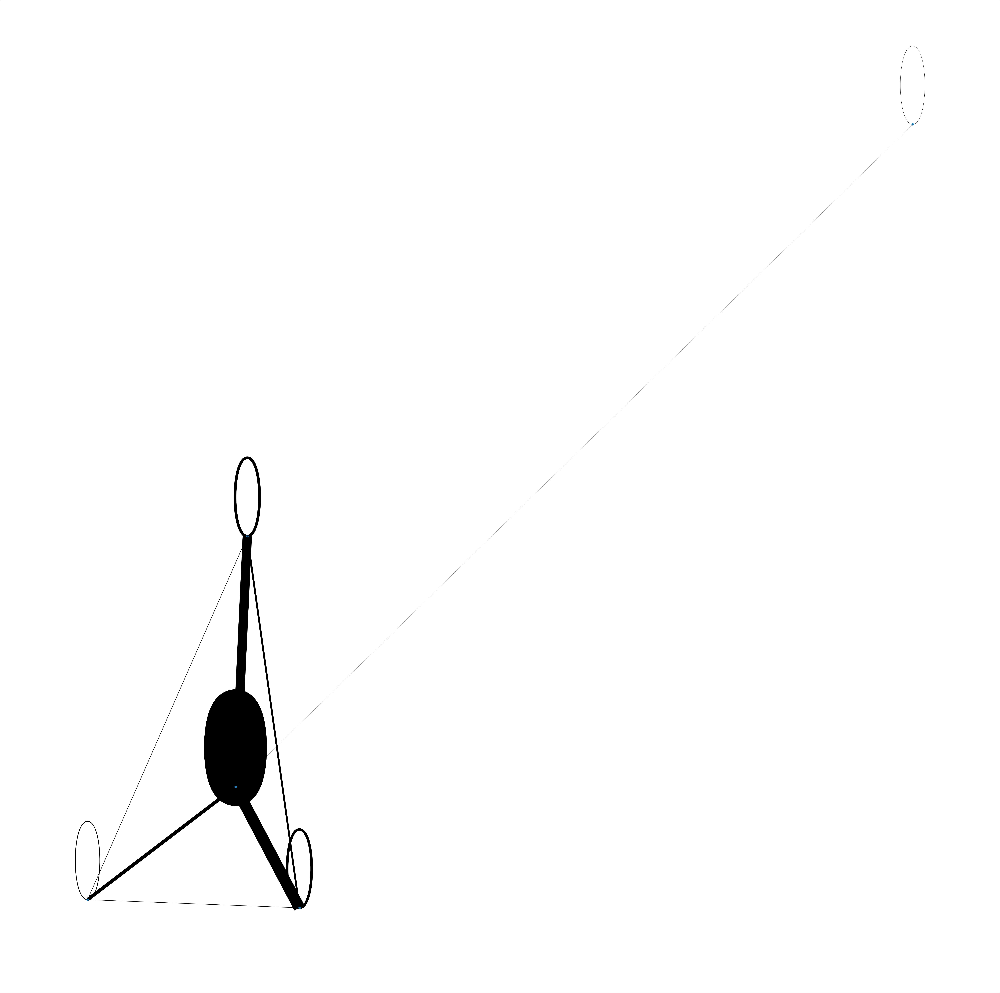

In [250]:
#induced graph based on communities. 
#not sure how to interpret this graph. 

#what do the ellipses mean?
pG = community_louvain.induced_graph(partition, G, weight='weight')
p_pos=nx.spring_layout(pG, scale = 1)

#weights proportional to edge weight. *0.1 for aesthetic purposes
weights = [pG[u][v]['weight']*0.1 for u, v in pG.edges()]

#what should the node size represent? sum of all weights within subgraph?
node_size = [pG.nodes[v] for v in pG.nodes]

fig = plt.figure(3, figsize=(140, 140), dpi=60)

nx.draw_networkx(pG, p_pos, edgelist = pG.edges(), width = weights,  with_labels=True)

In [279]:
# we have 4 communities and around 100 characters that are part of a community
#where did the ~700 others go?
#print community # and number of characters in it. 
partition_dict = {}
for character, par in partition.items():
    if par in partition_dict:
        partition_dict[par].append(character)
    else:
        partition_dict[par] = [character]
print(partition_dict[0])

for key, val in partition_dict.items():
    print(key, len(val))
# 

['Elladan', 'Elrond', 'Radagast', 'Great', 'Gwaihir', 'Sauron', 'Barahir', 'Ancalagon', 'Galdor', 'Isildur', 'Beren', 'Men', 'May', 'Saruman', 'Denethor', 'Glorfindel', 'Brand', 'Bowman', 'Blanco', 'Elwing', 'Dior', 'Thingol', 'Bain', 'Bard', 'Valandil', 'Grimbeorn', 'Elendil', 'Erestor', 'Thranduil', 'Ohtar', 'Celebrimbor', 'Beorn', 'Hador', 'Finrod', 'Marcho']
0 35
3 36
2 19
1 21
4 6
